Studying Domestic Homicide and Abuse in the US: 

In this project, I analyze the domestic abuse rate by percentage of men and women across different states in the US (using spatial and interactive visualizations). I also have used PDF Parsing to create data visualizations for understanding the relationship between the domestic survivor and the abuser, and the rates of abuser-survivor relationship by type in the US. Lastly, I analyze the level of harshness of firearm laws in four states against domestic abuse survivors. 

Domestic Homicides in the US

This was a Final Project submitted for my Data and Programming course. I have studied the trends and the laws around domestic abuse and homicides in the US, particularly focusing on four states, Florida, California, Alabama and New York. The document is divided into three parts:

National Level Analysis
Analysis of Domestic Abuse by Gender and Relationship of the ‘Victim’ with the offender (2003 – 2012)
Analysis of the harshness of laws in the above-mentioned four states which protect against the use of firearms, or possession of firearms by domestic abuse offenders.
Part1: The first part uses two datasets, a dataset on domestic abuse which indicates the percentage of men and women facing domestic abuse in different states of the US and a shapefile of the US. As we explore the data using interactive Chorpleth map, we can observe the differences between states in terms of their percentages of domestic abuse. We can observe high domestic abuse (percentage of men as victims) in states like Texas and Arkansas. States like Michigan and Wisconsin show lower percentages of domestic abuse among men.

Part 2: The second part uses the Nonfatal Domestic Violence, 2003–2012 data by the US Department of Justice, and shows how the rates Serious Violent Crime and assault relate with the relationship between the victim and the offender. Using a static plot, we can see that both assault and serious violent crimes are high both amongst ‘stranger’ , or ‘well-known acquaintances.’

Part 3: The part 3 uses four different documents for the four states by the National Council Against Domestic Violence which has summarized the firearms possession laws by domestic abuse offenders for different states. In this part, I study how harsh or non-harsh are the laws against the domestic abuse offenders whether or not they have strict laws prohibiting the possession, continued possession, buying of firearms by the domestic abuse offenders. I have used the help of trigrams to analyze the harshness of the laws in the four states, and based on the trigrams have created keywords which indicate whether the laws in a particular state are harsh or easy. Further, after taking a count of harsh_laws and easy_laws, I created a measure of harshness which simply counts the difference between harsh_law_counts and easy_law_counts. With the help of the data frame and plot produced at the end we can see that California leads the way in terms of putting the harshest laws against the possession of firearms by domestic abuse offenders, followed by New York and then Alabama, with Florida being the state with least harsh laws.

In [1]:
#Importing all important packages that will be used in this project. 
import pandas as pd
import matplotlib.pyplot as plt
import geopandas
import os
import tabula
from tabula import read_pdf
import PyPDF2
import requests
import numpy as np
import pdfrw
from pdfrw import PdfReader, PdfWriter
import spacy 
import autocorrect
from spacy import displacy
import re
import string
import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)
import nltk
from nltk.corpus import stopwords, brown
from nltk.tokenize import word_tokenize, sent_tokenize, RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from autocorrect import spell
from autocorrect import Speller
nltk.download('punkt')
from nltk import ngrams

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/bhargavithakur/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
#Loading the dataset and merging them 

def fetch_and_create_df(path, fname):
    #will need path to be changed 
    #Using python to download csv document showing data of percentage of women and men facing domestic abuse 
    #will require the csv path to be changed
    find_data = os.path.join(path, fname)
    if fname.endswith(".shp"):
        df = geopandas.read_file(find_data)
    elif fname.endswith(".csv"): 
        df = pd.read_csv(find_data)
    
    return df
path = r'/Users/bhargavithakur/Desktop/coding_samples'
fname = "csvData (1).csv"
df_us_domestic_abuse = fetch_and_create_df(path, fname)
print(df_us_domestic_abuse.head())
#change file path 
path_1 = r'/Users/bhargavithakur/Desktop/data and programming 2 /data_work/coding_samples 2/Python codes/shape_files/cb_2018_us_state_500k.shp'
fname = 'cb_2018_us_state_500k.shp'
df_us_states = fetch_and_create_df(path_1, fname)
print(df_us_states.head())
#Merging the dataset with the shapefile 
def merge_dataframes(df1, df2):
    '''
    '''
    df_us_states = df2.rename(columns={'NAME':'State'})
    df_merged = df_us_states.merge(df1 , on = 'State')
    
    return df_merged
df = merge_dataframes(df_us_domestic_abuse, df_us_states)
print(df.head())

            State  percWomen  percMen
0        Oklahoma       49.1     40.7
1        Kentucky       45.3     35.5
2            Iowa       45.3     29.3
3  North Carolina       43.9     19.3
4          Nevada       43.8     32.8
  STATEFP   STATENS     AFFGEOID GEOID STUSPS            NAME LSAD  \
0      28  01779790  0400000US28    28     MS     Mississippi   00   
1      37  01027616  0400000US37    37     NC  North Carolina   00   
2      40  01102857  0400000US40    40     OK        Oklahoma   00   
3      51  01779803  0400000US51    51     VA        Virginia   00   
4      54  01779805  0400000US54    54     WV   West Virginia   00   

          ALAND       AWATER  \
0  121533519481   3926919758   
1  125923656064  13466071395   
2  177662925723   3374587997   
3  102257717110   8528531774   
4   62266474513    489028543   

                                            geometry  
0  MULTIPOLYGON (((-88.50297 30.21523, -88.49176 ...  
1  MULTIPOLYGON (((-75.72681 35.93584, -75.71827

In [3]:
#Exploring through interactive map the percentage of men and women facing domestic abuse in the US
variables = ['percWomen' , 'percMen']

In [4]:
def map_explore_usa(variables , cmap = True):
    map_explore_usa = df.explore(variables[0] , cmap = 'YlGnBu') #This gives us the chloropleth map for percentage men facing domestic abuse in the US. 
   
    return map_explore_usa 
#By changing variable[0] to variable[1], we can see the chloropleth map for women by percentage facing domestic abuse in the US. 

In [5]:
map_explore_usa(variables)

In [6]:
#Part 2 : Visualization of survivor-abuser relationship 

In [7]:
#change file path
pdf_trend = r"/Users/bhargavithakur/Desktop/data and programming 2 /data_work/coding_samples 2/Python codes/parsing_files/ndv0312.pdf"

In [8]:
df_trend_2 = tabula.read_pdf(pdf_trend , pages = '5')
df_victim_relationship = df_trend_2[0]
df_victim_relationship.to_csv("victim_relationship.csv") #Converting the dataframe into a csv file 



In [9]:
df_victim_relationship.to_csv("victim_relationship.csv")


In [10]:
#will require changing the file_location
def dataframe_to_csv(path, fname):
    df_victim = pd.read_csv(os.path.join(path, fname))
    
    return df_victim



In [11]:
#change file path
path = r'/Users/bhargavithakur/Desktop/data and programming 2 /data_work/coding_samples 2/Python codes'
fname = 'victim_relationship.csv'
df_victim_relation = dataframe_to_csv(path, fname)

In [12]:
#Converting the dataframe into a csv file 
df_victim_relationship.to_csv("victim_relationship.csv")
#will require changing the file_location
def dataframe_to_csv(path, fname):
    df_victim = pd.read_csv(os.path.join(path, fname))
                            
    return df_victim
fname = 'victim_relationship.csv'
df_victim_relation = dataframe_to_csv(path, fname)

In [13]:
#working with only the rates of domestic abuse, and  thus dropping the percentage variables and data 
df_victim_relation = df_victim_relation.drop(['Unnamed: 0'] , axis = 1)
df_victim_relation = df_victim_relation.rename(columns={"violent crime": "Total Violent Crime", "violent crimea": "Serious Violent Crime" })
df_violence_rate = df_victim_relation.drop({'Victim–offender relationship.1',  'Male', 'Female', 'Male.1', 'Female.1'}, axis=1)


<ipython-input-14-198d630e8914>:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_violence_rate['Victim–offender relationship'] , fontsize= 5 ,rotation= 90)


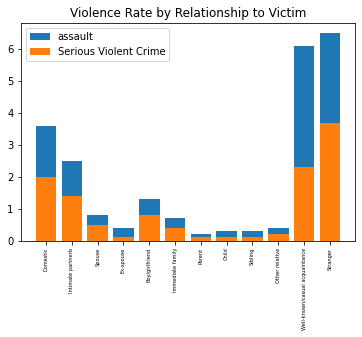

In [14]:
#Summarizing the data on  domestic violence cases by type of violence (a) Serious Violence Crime and (b) Assault 
#by looking at the relation of the 'victim' with the abuser, using plots. 
fig, ax = plt.subplots()
ax.bar(df_violence_rate['Victim–offender relationship'] ,df_violence_rate['assault'],  label='assault')
ax.bar(df_violence_rate['Victim–offender relationship'] , df_violence_rate['Serious Violent Crime'], label='Serious Violent Crime')
ax.set_xticklabels(df_violence_rate['Victim–offender relationship'] , fontsize= 5 ,rotation= 90)
ax.set_title('Violence Rate by Relationship to Victim')
ax.legend()
ax.autoscale_view()
plt.show()
#saving the plot figure 
#change file path
fig.savefig('/Users/bhargavithakur/Desktop/data and programming 2 /data_work/coding_samples 2/Python codes/figures/Figure 2022-03-14 093008.png')
#some errror here 

#Part3
#In this part I analyze the harshness of the firearm protection laws in four states 
#Four States: 1. Alabama 2. Florida 3. New York 4. California

#downloading the four files which have laws stating for the respective four states

#path1, path2, path3, path4 will require change of path

In [15]:
#change file paths
path1 = r"/Users/bhargavithakur/Desktop/data and programming 2 /data_work/coding_samples 2/Python codes/parsing_files/alabama_factsheet.pdf"
path2 = r"/Users/bhargavithakur/Desktop/data and programming 2 /data_work/coding_samples 2/Python codes/parsing_files/florida_factsheet.pdf"
path3 = r"/Users/bhargavithakur/Desktop/data and programming 2 /data_work/coding_samples 2/Python codes/parsing_files/newyork_factsheet.pdf"
path4 = r"//Users/bhargavithakur/Desktop/data and programming 2 /data_work/coding_samples 2/Python codes/parsing_files/california_factsheet.pdf"

In [16]:
#extracting the text from pdfs

def pdf_to_text(path):
    '''
    '''
    
    state_law = PyPDF2.PdfFileReader(path)
    #defining the useful pages in each document
    pages = [0,1]
    text_list = []
    for pnum in pages:
        page = state_law.getPage(pnum)
        text_list.append(page.extractText())
        #getting texts from all the four documents
    text0 = text_list[0]
    text1 = text_list[1]
    tot_text = text0 + text1
    
    return tot_text

In [17]:
#assigning variables for text of each of the states 
alabama_text = pdf_to_text(path1)
florida_text = pdf_to_text(path2)
newyork_text = pdf_to_text(path3)
california_text = pdf_to_text(path4)

#assigning a list containing all the above variables 
variables = [alabama_text , florida_text , newyork_text , california_text]

In [18]:
#defining a function to clean the text, by lowering all the words, checking language. 

def lower(t):
    spell = Speller(lang='en')
    texts = spell(t)
    
    return ' '.join([w.lower() for w in word_tokenize(t)])
lower_case = [] #created an empty list which will appended a later 
for t in variables:
    lower_case.append(lower(t))
#assigning variables for all lowerecase texts for each state


#creating trigrams for the text from each state's law text

def tokenized(l):
    token = l.split()
    esBigrams = ngrams(token, 3)

    return list(esBigrams)[:1000]

tokens = []

for l in lower_case:
    tokens.append(tokenized(l))
    

  
#creating tokens for each of the states' trigrams and storing them in a list called tokens
tokens

def df_state(token):
    df_state = pd.DataFrame(token)
    df_state['words'] = df_state[df_state.columns[0:]].apply(lambda x: ','.join(x.dropna().astype(str)), axis=1)
    df_state = df_state.replace(',',' ', regex=True)
    
    return df_state

In [19]:
#creating a dataframe for each state containing the trigrams and storing them in a list called df_states
df_states = []
for token in tokens:
    df_states.append(df_state(token))


df_alabama = df_states[0]
df_florida = df_states[1]
df_newyork = df_states[2]
df_california = df_states[3]

The following section will analyze the harshness using NLP 

In [20]:
#creating sentiment scale for harsh and easy laws
harsh_laws = ['prohibited from possessing' , 'from possessing firearms' , 'authorized to order' , 'necessary to protect' , 'requiring surrender .' , 'including dating partners' , 'relinquish their firearms' , 'background checks are' , 'must confiscate firearms']
easy_laws = ['prohibition does not' , 'does not apply' , 'does not prohibit'  , 'are not statutorily' , 'may include prohibiting' , 'buyer is not']

#Measuring Harshness for Alabama
harsh_count_alabama  = 0
easy_count_alabama = 0 
for t in df_alabama['words']:
    if t in harsh_laws:
        harsh_count_alabama += 1
    elif t in easy_laws:
        easy_count_alabama += 1
print('Harsh:', harsh_count_alabama , '\nDown:', easy_count_alabama )
harshness_alabama = harsh_count_alabama - easy_count_alabama

##Measuring Harshness for Florida
harsh_count_florida  = 0
easy_count_florida= 0 
for t in df_florida['words']:
    if t in harsh_laws:
        harsh_count_florida += 1
    elif t in easy_laws:
        easy_count_florida += 1
print('Harsh:', harsh_count_florida , '\nDown:', easy_count_florida )
harshness_florida = harsh_count_florida - easy_count_florida

##Measuring Harshness for Newyork
harsh_count_newyork  = 0
easy_count_newyork= 0 
for t in df_newyork['words']:
    if t in harsh_laws:
        harsh_count_newyork += 1
    elif t in easy_laws:
        easy_count_newyork += 1
print('Harsh:', harsh_count_newyork , '\nDown:', easy_count_newyork )
harshness_newyork= harsh_count_newyork - easy_count_newyork

##Measuring Harshness for California
harsh_count_cali  = 0
easy_count_cali = 0 
for t in df_california['words']:
    if t in harsh_laws:
        harsh_count_cali += 1
    elif t in easy_laws:
        easy_count_cali += 1
print('Harsh:', harsh_count_cali , '\nDown:', easy_count_cali )
harshness_cali= harsh_count_cali - easy_count_cali
       

Harsh: 9 
Down: 4
Harsh: 6 
Down: 3
Harsh: 5 
Down: 0
Harsh: 8 
Down: 0


In [21]:
#Creating a dataframe to represent harshness for  all the four states
harsh_count = [harsh_count_alabama , harsh_count_florida , harsh_count_newyork , harsh_count_cali]
easy_count = [easy_count_alabama , easy_count_florida , easy_count_newyork , easy_count_cali]
harshness = [harshness_alabama , harshness_florida , harshness_newyork, harshness_cali]
states = ['Alabama' , 'Florida' , 'Newyork' , 'California']
df_harshness = pd.DataFrame(states)
df_harshness['harsh_count'] = harsh_count
df_harshness = df_harshness.rename(columns={0:'State'})
df_harshness['easy_count'] = easy_count
df_harshness['harshness'] = harshness
df_harshness.to_csv("harshness_law.csv")


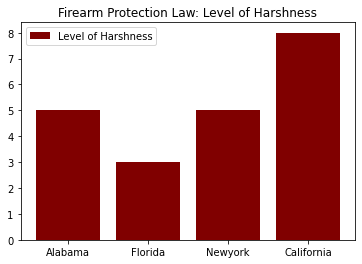

In [22]:
#creating plot to summarize harshness of the states 
fig, ax1 = plt.subplots()
ax1.bar(df_harshness['State'] ,df_harshness['harshness'] , label='Level of Harshness' , color = 'maroon')
ax1.set_title('Firearm Protection Law: Level of Harshness')
ax1.legend()
ax1.autoscale_view()
plt.show()
fig.savefig('ax1_harshness.png')
